Data Wrangling for Supply Chain Data



In [70]:
# Importing libraries
import os
import pandas as pd
import numpy as np
%matplotlib inline
import missingno as msno
import matplotlib.pyplot as plt
import random as random
import seaborn as sns
import scipy.stats as stats
from sklearn.impute import KNNImputer
import pandas_profiling as pp
import warnings
warnings.filterwarnings('ignore')


In [2]:
# Read csv file into a pandas dataframe
df = pd.read_csv("DataCoSupplyChainDataset.csv", encoding = 'ansi')

In [3]:
df.head()



,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class


In [61]:
df.dtypes

transaction.type             object
actual.shipping.days          int64
scheduled.shipping.days       int64
earning.per.order           float64
sales.per.customer          float64
delivery.status              object
isLate                       object
category.name                object
earning.per.order            object
earning.per.order            object
customer.segment             object
customer.state               object
department.name              object
Latitude                    float64
Longitude                   float64
Market                       object
order.city                   object
order.country                object
order.date                   object
order.id                      int64
order.item.discount         float64
order.item.discount.rate    float64
order.item.product.price    float64
order.item.profit.ratio     float64
order.item.quantity           int64
Sales                       float64
order.item.total            float64
order.profit.per.order      

## Type change?

isLate and product.status should be considered as categorical features not as ints.

In [65]:
df['isLate'] = df['isLate'].astype(object)
df['product.status'] = df['product.status'].astype(object)

order.id should also be categorical data

In [67]:
df['order.id'] = df['order.id'].astype(object)

## Missing Value Filter


### How many missing values in each columns

In [5]:
df.isna().sum()

Type                                  0
Days for shipping (real)              0
Days for shipment (scheduled)         0
Benefit per order                     0
Sales per customer                    0
Delivery Status                       0
Late_delivery_risk                    0
Category Id                           0
Category Name                         0
Customer City                         0
Customer Country                      0
Customer Email                        0
Customer Fname                        0
Customer Id                           0
Customer Lname                        8
Customer Password                     0
Customer Segment                      0
Customer State                        0
Customer Street                       0
Customer Zipcode                      3
Department Id                         0
Department Name                       0
Latitude                              0
Longitude                             0
Market                                0


4 Columns with Missing Values.


###### Columns: Customer Lname,Customer Zipcode,Order Zipcode,Product Description 

In [7]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'column_name': df.columns,
                                 'percent_missing': percent_missing})

How Many?

In [45]:
missing_value_df.sort_values('percent_missing', inplace=True)

In [46]:
percent_missing = df.isnull().sum() * 100 / len(df)

In [47]:
percent_missing

transaction.type                 0.0
actual.shipping.days             0.0
Days for shipment (scheduled)    0.0
Benefit per order                0.0
Sales per customer               0.0
Delivery Status                  0.0
Late_delivery_risk               0.0
Category Name                    0.0
Customer City                    0.0
Customer Country                 0.0
Customer Segment                 0.0
Customer State                   0.0
Department Name                  0.0
Latitude                         0.0
Longitude                        0.0
Market                           0.0
Order City                       0.0
Order Country                    0.0
order date (DateOrders)          0.0
Order Id                         0.0
Order Item Discount              0.0
Order Item Discount Rate         0.0
Order Item Product Price         0.0
Order Item Profit Ratio          0.0
Order Item Quantity              0.0
Sales                            0.0
Order Item Total                 0.0
O

Out of these 4, 3 were not needed in our analysis, while 1 (Product Description) was needed.


Product Description column has 100% missing values, so we will drop it as well.

In [29]:
df.drop(['Customer Lname', 'Customer Zipcode','Order Zipcode','Product Description'], axis =1,inplace=True)

Other columns to drop as decided (Those not useful in Analysis)

In [42]:
df.drop(['Customer Id'], axis =1, inplace=True)

In [44]:
df.drop(['Category Id', 'Customer Email','Customer Fname','Customer Password','Customer Street','Department Id','Order Customer Id','Order Item Cardprod Id','Order Item Id','Product Card Id','Product Category Id','Product Image'], axis =1, inplace=True)

No missing Values remaining..

<AxesSubplot:>

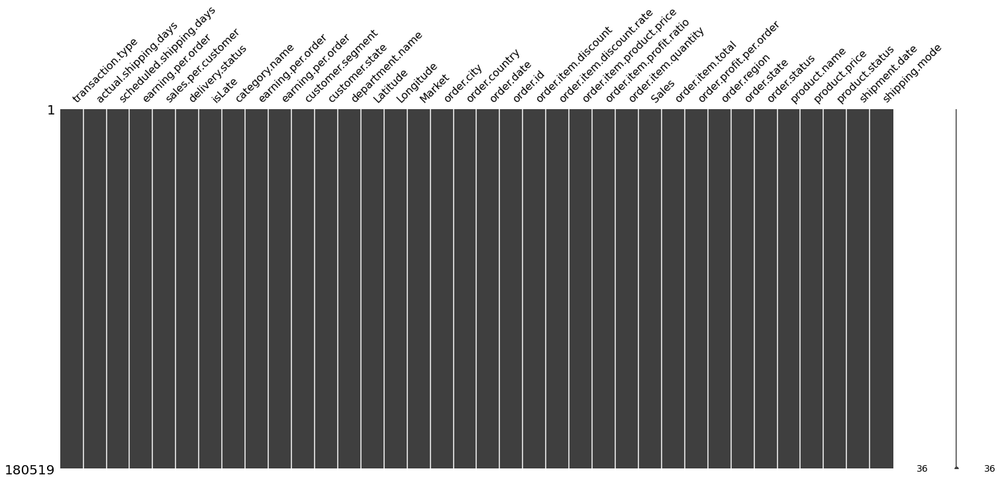

In [53]:
msno.matrix(df)

Renaming Variables...

In [52]:
df.rename(columns = {'Type':'transaction.type'}, inplace = True)
df.rename(columns = {'Days for shipping (real)':'actual.shipping.days'}, inplace = True)
df.rename(columns = {'Days for shipment (scheduled)':'scheduled.shipping.days'}, inplace = True)
df.rename(columns = {'Benefit per order':'earning.per.order'}, inplace = True)
df.rename(columns = {'Sales per customer':'sales.per.customer'}, inplace = True)
df.rename(columns = {'Delivery Status':'delivery.status'}, inplace = True)
df.rename(columns = {'Late_delivery_risk':'isLate'}, inplace = True)
df.rename(columns = {'Category Name':'category.name'}, inplace = True)
df.rename(columns = {'Customer City':'customer.city'}, inplace = True)
df.rename(columns = {'Customer Country':'customer.country'}, inplace = True)
df.rename(columns = {'Customer Segment':'customer.segment'}, inplace = True)
df.rename(columns = {'Customer State':'customer.state'}, inplace = True)
df.rename(columns = {'Department Name':'department.name'}, inplace = True)
df.rename(columns = {'Order City':'order.city'}, inplace = True)
df.rename(columns = {'Order Country':'order.country'}, inplace = True)
df.rename(columns = {'order date (DateOrders)':'order.date'}, inplace = True)
df.rename(columns = {'Order Id':'order.id'}, inplace = True)
df.rename(columns = {'Order Item Discount':'order.item.discount'}, inplace = True)
df.rename(columns = {'Order Item Discount Rate':'order.item.discount.rate'}, inplace = True)
df.rename(columns = {'Order Item Product Price':'order.item.product.price'}, inplace = True)
df.rename(columns = {'Order Item Profit Ratio':'order.item.profit.ratio'}, inplace = True)
df.rename(columns = {'Order Item Quantity':'order.item.quantity'}, inplace = True)
df.rename(columns = {'Order Item Total':'order.item.total'}, inplace = True)
df.rename(columns = {'Order Profit Per Order':'order.profit.per.order'}, inplace = True)
df.rename(columns = {'Order Region':'order.region'}, inplace = True)
df.rename(columns = {'Order State':'order.state'}, inplace = True)
df.rename(columns = {'Order Status':'order.status'}, inplace = True)
df.rename(columns = {'Product Name':'product.name'}, inplace = True)
df.rename(columns = {'Product Price':'product.price'}, inplace = True)
df.rename(columns = {'Product Status':'product.status'}, inplace = True)
df.rename(columns = {'shipping date (DateOrders)':'shipment.date'}, inplace = True)
df.rename(columns = {'Shipping Mode':'shipping.mode'}, inplace = True)


# Outlier Analysis

Numeric Data

Note that we will not consider Latitude and Longtitude in our outlier analysis for Numeric Data

There are 13 numeric features

Describe the numeric Data

In [69]:
df.describe()

,actual.shipping.days,scheduled.shipping.days,earning.per.order,sales.per.customer,Latitude,Longitude,order.item.discount,order.item.discount.rate,order.item.product.price,order.item.profit.ratio,order.item.quantity,Sales,order.item.total,order.profit.per.order,product.price
count,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000
mean,3.497654,2.931847,21.974989,183.107609,29.719955,-84.915675,20.664741,0.101668,141.232550,0.120647,2.127638,203.772096,183.107609,21.974989,141.232550
std,1.623722,1.374449,104.433526,120.043670,9.813646,21.433241,21.800901,0.070415,139.732492,0.466796,1.453451,132.273077,120.043670,104.433526,139.732492
min,0.000000,0.000000,-4274.979980,7.490000,-33.937553,-158.025986,0.000000,0.000000,9.990000,-2.750000,1.000000,9.990000,7.490000,-4274.979980,9.990000
25%,2.000000,2.000000,7.000000,104.379997,18.265432,-98.446312,5.400000,0.040000,50.000000,0.080000,1.000000,119.980003,104.379997,7.000000,50.000000
50%,3.000000,4.000000,31.520000,163.990005,33.144863,-76.847908,14.000000,0.100000,59.990002,0.270000,1.000000,199.919998,163.990005,31.520000,59.990002
75%,5.000000,4.000000,64.800003,247.399994,39.279617,-66.370583,29.990000,0.160000,199.990005,0.360000,3.000000,299.950012,247.399994,64.800003,199.990005
max,6.000000,4.000000,911.799988,1939.989990,48.781933,115.263077,500.000000,0.250000,1999.989990,0.500000,5.000000,1999.989990,1939.989990,911.799988,1999.989990


From the manual analysis, it seems there are no outliers in these features that needs our attention

#### Quantiles

In [54]:
max_threshold = df['actual.shipping.days'].quantile(0.95)
max_threshold

6.0

### > max_threshold outlier

In [55]:
df[df['actual.shipping.days']>max_threshold]

,transaction.type,actual.shipping.days,scheduled.shipping.days,earning.per.order,sales.per.customer,delivery.status,isLate,category.name,earning.per.order,earning.per.order,...,order.item.total,order.profit.per.order,order.region,order.state,order.status,product.name,product.price,product.status,shipment.date,shipping.mode


### < min_threshold outliers

In [56]:
min_threshold = df['actual.shipping.days'].quantile(0.05)
min_threshold

1.0

In [57]:
df[df['actual.shipping.days']<min_threshold]

,transaction.type,actual.shipping.days,scheduled.shipping.days,earning.per.order,sales.per.customer,delivery.status,isLate,category.name,earning.per.order,earning.per.order,...,order.item.total,order.profit.per.order,order.region,order.state,order.status,product.name,product.price,product.status,shipment.date,shipping.mode
19,PAYMENT,0,0,87.180000,311.359985,Shipping on time,0,Sporting Goods,Mount Prospect,EE. UU.,...,311.359985,87.180000,South Asia,Madhya Pradesh,PENDING_PAYMENT,Smart watch,327.750000,0,1/13/2018 18:09,Same Day
20,TRANSFER,0,0,154.860001,309.720001,Shipping on time,0,Sporting Goods,Long Beach,EE. UU.,...,309.720001,154.860001,South Asia,Madhya Pradesh,PROCESSING,Smart watch,327.750000,0,1/13/2018 17:48,Same Day
387,TRANSFER,0,0,149.449997,311.359985,Shipping on time,0,Sporting Goods,Marietta,EE. UU.,...,311.359985,149.449997,Southeast Asia,Yogyakarta,PENDING,Smart watch,327.750000,0,1/12/2018 23:14,Same Day
388,PAYMENT,0,0,80.529999,309.720001,Shipping on time,0,Sporting Goods,Caguas,Puerto Rico,...,309.720001,80.529999,Southeast Asia,Yogyakarta,PENDING_PAYMENT,Smart watch,327.750000,0,1/12/2018 22:53,Same Day
389,CASH,0,0,-34.750000,304.809998,Shipping on time,0,Sporting Goods,Holland,EE. UU.,...,304.809998,-34.750000,Oceania,Queensland,CLOSED,Smart watch,327.750000,0,1/12/2018 22:32,Same Day
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180253,CASH,0,0,121.669998,359.980011,Shipping on time,0,Fishing,Florissant,EE. UU.,...,359.980011,121.669998,South Asia,Karnataka,CLOSED,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/30/2016 20:12,Same Day
180304,TRANSFER,0,0,181.429993,377.980011,Shipping on time,0,Fishing,West Chester,EE. UU.,...,377.980011,181.429993,Eastern Asia,Hubei,PENDING,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/27/2016 21:05,Same Day
180305,TRANSFER,0,0,135.029999,371.980011,Shipping on time,0,Fishing,Murfreesboro,EE. UU.,...,371.980011,135.029999,Southeast Asia,Capital Nacional,PENDING,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/27/2016 18:59,Same Day
180414,TRANSFER,0,0,132.130005,363.980011,Shipping on time,0,Fishing,Washington,EE. UU.,...,363.980011,132.130005,Eastern Asia,Guangdong,PENDING,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/22/2016 12:51,Same Day


## Through Pandas Profiling Package

In [84]:
pp.ProfileReport(df)

Render HTML: 100%|██████████| 1/1 [00:11<00:00, 11.95s/it]


Output wrangled file 

In [85]:
df.to_csv("SupplyChainDataSet.csv")  